In [22]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
import torchaudio
import soundfile as sf
import seaborn as sns

from pathlib import Path
import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import Audio

In [3]:
train_dir = Path('E:\data\BirdCLEF')
train_audio = train_dir / 'train_audio'
train_csv = train_dir / 'train_metadata.csv'
taxonomy_csv = train_dir / 'eBird_Taxonomy_v2021.csv'

### Metadata

In [4]:
taxonomy_df = pd.read_csv(taxonomy_csv)
meta_df = pd.read_csv(train_csv)

meta_df.shape, taxonomy_df.shape

((24459, 12), (16753, 9))

In [5]:
meta_df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg
2,asbfly,[],['song'],36.3319,127.3555,Muscicapa dauurica,Asian Brown Flycatcher,Stuart Fisher,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/175797,asbfly/XC175797.ogg
3,asbfly,[],['call'],21.1697,70.6005,Muscicapa dauurica,Asian Brown Flycatcher,vir joshi,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/207738,asbfly/XC207738.ogg
4,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/209218,asbfly/XC209218.ogg


In [6]:
taxonomy_df.head()

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN


In [7]:
taxonomy_df['SPECIES_CODE'].count()

16753

In [8]:
taxonomy_df[taxonomy_df['SPECIES_CODE'] == 'integr']

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
4037,7207,species,integr,Intermediate Egret,Ardea intermedia,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN


In [9]:
meta_df.primary_label.value_counts()

primary_label
zitcis1    500
lirplo     500
litgre1    500
comgre     500
comkin1    500
          ... 
blaeag1      6
wynlau1      6
niwpig1      5
asiope1      5
integr       5
Name: count, Length: 182, dtype: int64

In [10]:
meta_df.filename[0]

'asbfly/XC134896.ogg'

In [11]:
# import plotly.io as pio
# pio.renderers

In [12]:
data, rate = torchaudio.load(train_audio / meta_df.filename[0])
print("Audio data shape:", data.shape)
print("Sample rate:", rate)

Audio data shape: torch.Size([1, 875207])
Sample rate: 32000


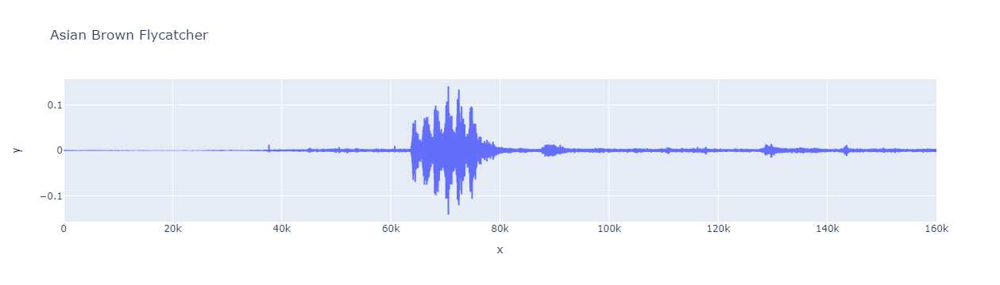

In [26]:
display(Audio(data[0, :rate*5], rate=rate))
px.line(y=data[0, :rate*5], title=meta_df.common_name[0])
# fig.show()

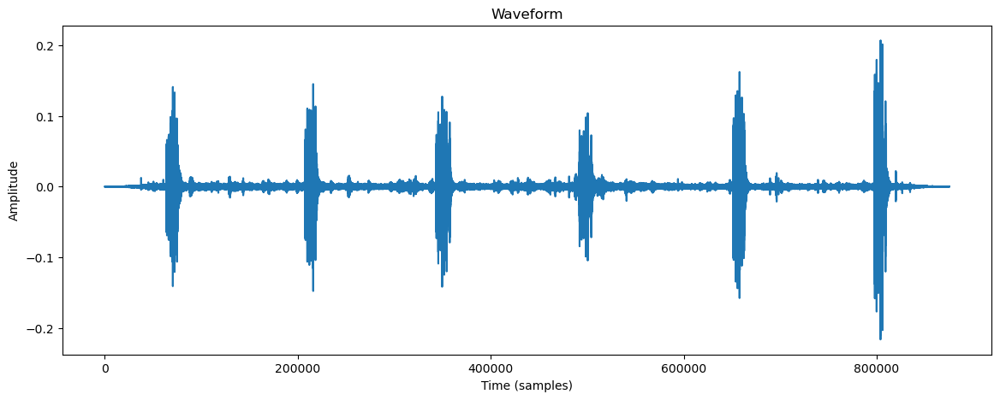

In [30]:
plt.figure(figsize=(14, 5))
plt.plot(data[0, 0:])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.title('Waveform')
plt.show()

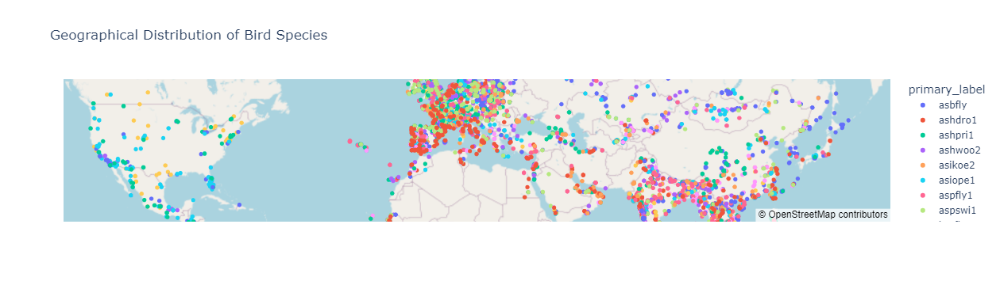

In [24]:
# Assuming metadata_df contains the data
# Create scatter plot on a map
fig = px.scatter_mapbox(meta_df, lat='latitude', lon='longitude', color='primary_label', 
                        hover_name='primary_label', hover_data=['latitude', 'longitude'], 
                        title='Geographical Distribution of Bird Species',
                        zoom=1, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [ ]:
foo